<a href="https://colab.research.google.com/github/SRINIVASDEVARAJULA/Technical-task/blob/main/model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [79]:
pip install chart-studio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [80]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as plt
%matplotlib inline
from sklearn.metrics import classification_report,confusion_matrix
from __future__ import division
from sklearn.cluster import KMeans
import plotly.graph_objs as go
#import plotly.plotly as py
import plotly.offline as pyoff
import plotly.graph_objs as go

In [81]:
df=pd.read_csv("anon_modified_data.csv")

<ipython-input-81-b1f8426e0207>:1: DtypeWarning:

Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.



In [82]:
df.shape

(486423, 14)

In [83]:
# Convert the 'ShipDate' column to datetime format
df['ShipDate'] = pd.to_datetime(df['ShipDate'])

# Now you can use the .dt accessor on the 'ShipDate' column
print(df['ShipDate'].dt.year)

0         2021
1         2021
2         2021
3         2021
4         2021
          ... 
486418    2023
486419    2023
486420    2023
486421    2023
486422    2023
Name: ShipDate, Length: 486423, dtype: int64


In [84]:
# Filter out rows with ShipDate in 2023
df = df[df['ShipDate'].dt.year != 2023]

In [85]:
df.shape

(417406, 14)

In [86]:
df.head()

,CustomerId,SalesOrderNumber,SalesOrderLineNumber,ShipDate,Qty,Brand,ProductType,ProductSupplierID,Revenue,Profit,Freight cost,SalesTeamName,year,month_year
0,100002803,2913843,10,2021-02-04,2,Microsoft,Operating System Software,1000477.0,254.213783,1.271048,0.0,Components North,2021,2021-02
1,100003323,2918083,50,2021-02-04,1,Microsoft,Utilities Software,1000477.0,191.682001,6.179373,0.0,Corporate North,2021,2021-02
2,100016168,2916878,20,2021-02-04,1,Unknown,IT Support Services,1000465.0,0.000000,-8.011783,0.0,Corporate North,2021,2021-02
3,100001590,2470475,10,2021-02-04,10,Lenovo,Notebook Computers,1000133.0,21362.979640,133.944138,0.0,Corporate South,2021,2021-02
4,100001590,2544987,10,2021-02-04,5,Lenovo,Notebook Computers,1000133.0,4344.370602,27.639497,0.0,Corporate South,2021,2021-02


In [87]:
df.nunique()

CustomerId                3192
SalesOrderNumber        321379
SalesOrderLineNumber       105
ShipDate                   498
Qty                        810
Brand                      330
ProductType                418
ProductSupplierID          323
Revenue                 416448
Profit                  416666
Freight cost              8213
SalesTeamName                8
year                         2
month_year                  24
dtype: int64

In [88]:
df["ShipDate"] = pd.to_datetime(df["ShipDate"])

In [89]:
df=df[df.Revenue>0]

In [90]:
df.shape

(395526, 14)

In [91]:
# Determine the most recent date in the dataset
most_recent_date = df["ShipDate"].max()

# Calculate the number of days since each customer's last purchase
recency = df.groupby("CustomerId")["ShipDate"].apply(lambda x: (most_recent_date - x.max()).days).reset_index(name='Recency')
# Calculate Frequency
frequency = df.groupby('CustomerId')['SalesOrderNumber'].nunique().reset_index(name='Frequency')

# Calculate Monetary Value
monetary_value = df.groupby('CustomerId')['Revenue'].sum().reset_index(name='MonetaryValue')

In [92]:
df = pd.merge(df, recency, on="CustomerId")
df = pd.merge(df, frequency, on="CustomerId")
df = pd.merge(df, monetary_value, on="CustomerId")

In [93]:
df.nunique()

CustomerId                3155
SalesOrderNumber        301157
SalesOrderLineNumber        75
ShipDate                   497
Qty                        652
Brand                      323
ProductType                416
ProductSupplierID          311
Revenue                 395521
Profit                  394819
Freight cost              8206
SalesTeamName                8
year                         2
month_year                  24
Recency                    350
Frequency                  269
MonetaryValue             3155
dtype: int64

In [94]:
df.groupby("CustomerId").agg({'Recency': 'mean', 'Frequency': 'mean', 'MonetaryValue': 'mean'})

,Recency,Frequency,MonetaryValue
CustomerId,,,
100000003,31.0,5.0,539.499552
100000005,21.0,3.0,1130.302162
100000015,114.0,4.0,4133.652421
100000029,71.0,1.0,57.950596
100000034,1.0,286.0,95027.294138
...,...,...,...
100023982,9.0,1.0,307.754962
100024014,141.0,1.0,1617.504955
100024024,110.0,1.0,161.616871


In [95]:
df.Recency.describe()

count    395526.000000
mean         12.652025
std          50.913221
min           0.000000
25%           1.000000
50%           1.000000
75%           8.000000
max         724.000000
Name: Recency, dtype: float64

 with a minimum of 1 day and a maximum of 724 days. The mean Recency is 12.76 days and the median (50%) is 1 day, which suggests that the majority of customers made a purchase very recently. The standard deviation of 50.89 days indicates that there is some variation in Recency values among customers, with some having made a purchase much longer ago than others. The quartiles indicate that 75% of the customers made a purchase within the past 8 days.

In [96]:
ax= sns.distplot

In [97]:
df.Frequency.describe()

count    395526.000000
mean      11155.014507
std       13188.441534
min           1.000000
25%         335.000000
50%        4841.000000
75%       16208.000000
max       38545.000000
Name: Frequency, dtype: float64

Based on the output of the describe() method, we can see that the mean frequency of purchases is 11,155 and the median frequency is 4,841. The maximum frequency is 38,545 and the minimum is 1. The standard deviation is 13,188 which is quite high, indicating a wide range of frequency values.

<ipython-input-98-f07efae1ddf0>:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




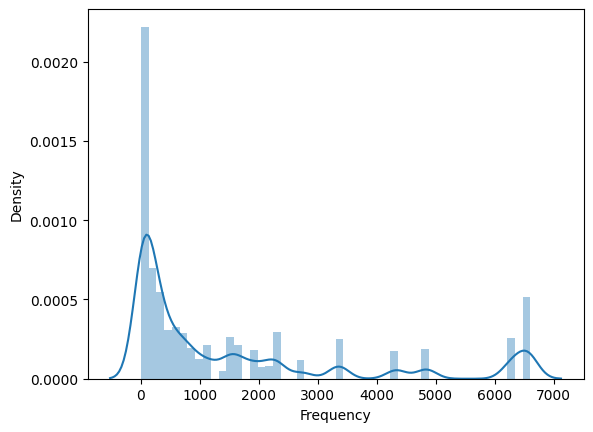

In [98]:
x = df.query('Frequency < 10000')['Frequency']

ax = sns.distplot(x)

In [99]:
df.MonetaryValue.describe()

count    3.955260e+05
mean     1.078089e+07
std      1.476359e+07
min      8.064020e-03
25%      3.558300e+05
50%      6.087923e+06
75%      1.416485e+07
max      5.950739e+07
Name: MonetaryValue, dtype: float64

<ipython-input-100-053f92733fc1>:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




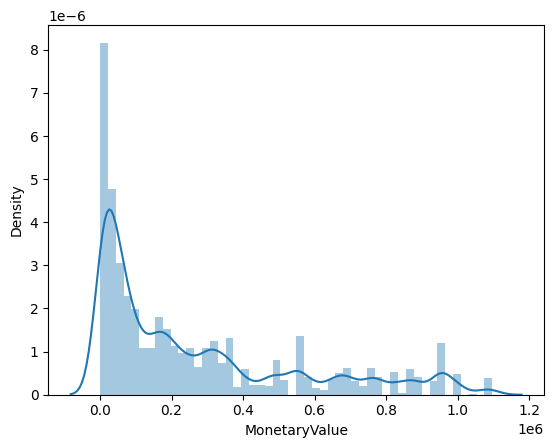

In [100]:
x = df.query('MonetaryValue < 1100000')['MonetaryValue']

ax = sns.distplot(x)

In [101]:
#Split into four segments using quantiles
quantiles = df.quantile(q=[0.25,0.5,0.75])
quantiles = quantiles.to_dict()

<ipython-input-101-006314bef0a0>:2: FutureWarning:

The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



In [102]:
quantiles

{'CustomerId': {0.25: 100002069.0, 0.5: 100004474.0, 0.75: 100007970.0},
 'SalesOrderLineNumber': {0.25: 10.0, 0.5: 10.0, 0.75: 20.0},
 'Qty': {0.25: 1.0, 0.5: 1.0, 0.75: 4.0},
 'ProductSupplierID': {0.25: 1000033.0, 0.5: 1000056.0, 0.75: 1000171.0},
 'Revenue': {0.25: 45.2815782825, 0.5: 149.25569645, 0.75: 536.412006675},
 'Profit': {0.25: 1.50097758225, 0.5: 5.3897881475, 0.75: 17.2507574975},
 'Freight cost': {0.25: 1.63, 0.5: 4.57, 0.75: 4.89},
 'year': {0.25: 2021.0, 0.5: 2022.0, 0.75: 2022.0},
 'Recency': {0.25: 1.0, 0.5: 1.0, 0.75: 8.0},
 'Frequency': {0.25: 335.0, 0.5: 4841.0, 0.75: 16208.0},
 'MonetaryValue': {0.25: 355829.97465832304,
  0.5: 6087923.489922056,
  0.75: 14164854.715311378}}

In [103]:
#Functions to create R, F and M segments
def RScoring(x,p,d):
    if x <= d[p][0.25]:
        return 1
    elif x <= d[p][0.50]:
        return 2
    elif x <= d[p][0.75]: 
        return 3
    else:
        return 4
    
def FnMScoring(x,p,d):
    if x <= d[p][0.25]:
        return 4
    elif x <= d[p][0.50]:
        return 3
    elif x <= d[p][0.75]: 
        return 2
    else:
        return 1

In [104]:
#Calculate Add R, F and M segment value columns in the existing dataset to show R, F and M segment values
df['R'] = df['Recency'].apply(RScoring, args=('Recency',quantiles,))
df['F'] = df['Frequency'].apply(FnMScoring, args=('Frequency',quantiles,))
df['M'] = df['MonetaryValue'].apply(FnMScoring, args=('MonetaryValue',quantiles,))
df.head()

,CustomerId,SalesOrderNumber,SalesOrderLineNumber,ShipDate,Qty,Brand,ProductType,ProductSupplierID,Revenue,Profit,Freight cost,SalesTeamName,year,month_year,Recency,Frequency,MonetaryValue,R,F,M
0,100002803,2913843,10,2021-02-04,2,Microsoft,Operating System Software,1000477.0,254.213783,1.271048,0.00,Components North,2021,2021-02,1,16208,6.211357e+06,1,2,2
1,100002803,2922507,10,2021-03-04,1,Dell,Notebook Computers,1000003.0,595.090807,11.269791,4.53,Corporate North,2021,2021-03,1,16208,6.211357e+06,1,2,2
2,100002803,2925823,10,2021-03-04,1,Dell,Notebook Computers,1000003.0,536.574878,10.814564,4.53,Corporate North,2021,2021-03,1,16208,6.211357e+06,1,2,2
3,100002803,2926127,10,2021-03-04,1,Startech,USB Cables,1000171.0,1.247147,0.035051,4.53,Components North,2021,2021-03,1,16208,6.211357e+06,1,2,2
4,100002803,2929031,10,2021-06-04,1,Startech,Computer Cooling Fan,1000171.0,1.494133,0.044620,4.53,Components North,2021,2021-06,1,16208,6.211357e+06,1,2,2


In [105]:
#Calculate and Add RFMGroup value column showing combined concatenated score of RFM
df['RFMGroup'] = df.R.map(str) + df.F.map(str) + df.M.map(str)

#Calculate and Add RFMScore value column showing total sum of RFMGroup values
df['RFMScore'] = df[['R', 'F', 'M']].sum(axis = 1)
df.head()

,CustomerId,SalesOrderNumber,SalesOrderLineNumber,ShipDate,Qty,Brand,ProductType,ProductSupplierID,Revenue,Profit,...,year,month_year,Recency,Frequency,MonetaryValue,R,F,M,RFMGroup,RFMScore
0,100002803,2913843,10,2021-02-04,2,Microsoft,Operating System Software,1000477.0,254.213783,1.271048,...,2021,2021-02,1,16208,6.211357e+06,1,2,2,122,5
1,100002803,2922507,10,2021-03-04,1,Dell,Notebook Computers,1000003.0,595.090807,11.269791,...,2021,2021-03,1,16208,6.211357e+06,1,2,2,122,5
2,100002803,2925823,10,2021-03-04,1,Dell,Notebook Computers,1000003.0,536.574878,10.814564,...,2021,2021-03,1,16208,6.211357e+06,1,2,2,122,5
3,100002803,2926127,10,2021-03-04,1,Startech,USB Cables,1000171.0,1.247147,0.035051,...,2021,2021-03,1,16208,6.211357e+06,1,2,2,122,5
4,100002803,2929031,10,2021-06-04,1,Startech,Computer Cooling Fan,1000171.0,1.494133,0.044620,...,2021,2021-06,1,16208,6.211357e+06,1,2,2,122,5


In [106]:
#Assign Loyalty Level to each customer
Loyalty_Level = ['Platinum', 'Gold', 'Silver', 'Bronze']
Score_cuts = pd.qcut(df.RFMScore, q = 4, labels = Loyalty_Level)
df['RFM_Loyalty_Level'] = Score_cuts.values
df.reset_index().index[100:150]

RangeIndex(start=100, stop=150, step=1)

In [107]:
df['RFM_Loyalty_Level'].unique()

['Gold', 'Bronze', 'Platinum', 'Silver']
Categories (4, object): ['Platinum' < 'Gold' < 'Silver' < 'Bronze']

In [108]:
#Validate the data for RFMGroup = 111
df[df['RFMGroup']=='111'].sort_values('MonetaryValue', ascending=False).reset_index().head(10)

,index,CustomerId,SalesOrderNumber,SalesOrderLineNumber,ShipDate,Qty,Brand,ProductType,ProductSupplierID,Revenue,...,month_year,Recency,Frequency,MonetaryValue,R,F,M,RFMGroup,RFMScore,RFM_Loyalty_Level
0,90148,100007970,2335886,10,2021-03-04,8,Hannspree,Monitors,1000078.0,603.639087,...,2021-03,0,38545,3.030605e+07,1,1,1,111,3,Platinum
1,119256,100007970,1004980058,10,2022-02-25,1,Logitech,Keyboard and Mouse,1000040.0,14.371180,...,2022-02,0,38545,3.030605e+07,1,1,1,111,3,Platinum
2,119248,100007970,1004979438,10,2022-02-25,1,Dell,Notebook Computers,1000003.0,606.117940,...,2022-02,0,38545,3.030605e+07,1,1,1,111,3,Platinum
3,119249,100007970,1004979639,10,2022-02-25,1,Dell,Professional Notebook,1000003.0,1389.164389,...,2022-02,0,38545,3.030605e+07,1,1,1,111,3,Platinum
4,119250,100007970,1004978226,10,2022-02-25,1,Dell,Professional Desktop PC,1000003.0,392.717806,...,2022-02,0,38545,3.030605e+07,1,1,1,111,3,Platinum
5,119251,100007970,1004979622,10,2022-02-25,1,LG,Televisions,1000042.0,341.808845,...,2022-02,0,38545,3.030605e+07,1,1,1,111,3,Platinum
6,119252,100007970,1004979705,10,2022-02-25,2,Acer,Monitors,1000079.0,728.098258,...,2022-02,0,38545,3.030605e+07,1,1,1,111,3,Platinum
7,119253,100007970,1004979865,10,2022-02-25,1,Dell,Notebook Cases,1000003.0,31.661331,...,2022-02,0,38545,3.030605e+07,1,1,1,111,3,Platinum
8,119254,100007970,1004979774,10,2022-02-25,1,LG,Monitors,1000042.0,103.436600,...,2022-02,0,38545,3.030605e+07,1,1,1,111,3,Platinum
9,119255,100007970,1004980000,10,2022-02-25,1,Dell,Notebook Computers,1000003.0,337.166315,...,2022-02,0,38545,3.030605e+07,1,1,1,111,3,Platinum


In [109]:
df[["RFM_Loyalty_Level", "Recency","Frequency","MonetaryValue"]].groupby("RFM_Loyalty_Level").agg(["mean","count","max"]).round()

Recency              Frequency                MonetaryValue  \
                     mean   count  max      mean   count    max          mean   
RFM_Loyalty_Level                                                               
Platinum              1.0  135630    1   26521.0  135630  38545    25819922.0   
Gold                  1.0   62368    1   10143.0   62368  16208     7614535.0   
Silver                4.0  100698   17    1687.0  100698   4841     2663816.0   
Bronze               46.0   96830  724     129.0   96830    830      196432.0   

                                       
                    count         max  
RFM_Loyalty_Level                      
Platinum           135630  59507388.0  
Gold                62368  11451833.0  
Silver             100698  17609654.0  
Bronze              96830   3431649.0

In [110]:
import chart_studio as cs
import plotly.offline as po
import plotly.graph_objs as gobj

#Recency Vs Frequency
graph = df.query("MonetaryValue < 5000000 and Frequency < 20000")

plot_data = [
    gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Bronze'")['Recency'],
        y=graph.query("RFM_Loyalty_Level == 'Bronze'")['Frequency'],
        mode='markers',
        name='Bronze',
        marker= dict(size= 7,
            line= dict(width=1),
            color= 'blue',
            opacity= 0.8
           )
    ),
        gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Silver'")['Recency'],
        y=graph.query("RFM_Loyalty_Level == 'Silver'")['Frequency'],
        mode='markers',
        name='Silver',
        marker= dict(size= 9,
            line= dict(width=1),
            color= 'green',
            opacity= 0.5
           )
    ),
    gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Gold'")['Recency'],
        y=graph.query("RFM_Loyalty_Level == 'Gold'")['Frequency'],
        mode='markers',
        name='Gold',
        marker= dict(size= 11,
            line= dict(width=1),
            color= 'red',
            opacity= 0.9
           )
    ),
    gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Platinum'")['Recency'],
        y=graph.query("RFM_Loyalty_Level == 'Platinum'")['Frequency'],
        mode='markers',
        name='Platinum',
        marker= dict(size= 13,
            line= dict(width=1),
            color= 'black',
            opacity= 0.9
           )
    ),
]
plot_layout = gobj.Layout(
        yaxis= {'title': "Frequency"},
        xaxis= {'title': "Recency"},
        title='Segments'
    )
fig = gobj.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)

#Frequency Vs Monetary
graph = df.query("MonetaryValue < 5000000 and Frequency < 20000")

plot_data = [
    gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Bronze'")['Frequency'],
        y=graph.query("RFM_Loyalty_Level == 'Bronze'")['MonetaryValue'],
        mode='markers',
        name='Bronze',
        marker= dict(size= 7,
            line= dict(width=1),
            color= 'blue',
            opacity= 0.8
           )
    ),
        gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Silver'")['Frequency'],
        y=graph.query("RFM_Loyalty_Level == 'Silver'")['MonetaryValue'],
        mode='markers',
        name='Silver',
        marker= dict(size= 9,
            line= dict(width=1),
            color= 'green',
            opacity= 0.5
           )
    ),
       gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Gold'")['Frequency'],
        y=graph.query("RFM_Loyalty_Level == 'Gold'")['MonetaryValue'],
        mode='markers',
        name='Gold',
        marker= dict(size= 11,
            line= dict(width=1),
            color= 'red',
            opacity= 0.9
           )
    ),
    gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Platinum'")['Frequency'],
        y=graph.query("RFM_Loyalty_Level == 'Platinum'")['MonetaryValue'],
        mode='markers',
        name='Platinum',
        marker= dict(size= 13,
            line= dict(width=1),
            color= 'black',
            opacity= 0.9
           )
    ),
]
plot_layout = gobj.Layout(
        yaxis= {'title': "Monetary"},
        xaxis= {'title': "Frequency"},
        title='Segments'
    )
fig = gobj.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)

#Recency Vs Monetary
graph = df.query("MonetaryValue < 5000000 and Frequency < 20000")

plot_data = [
    gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Bronze'")['Recency'],
        y=graph.query("RFM_Loyalty_Level == 'Bronze'")['MonetaryValue'],
        mode='markers',
        name='Bronze',
        marker= dict(size= 7,
            line= dict(width=1),
            color= 'blue',
            opacity= 0.8
           )
    ),
        gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Silver'")['Recency'],
        y=graph.query("RFM_Loyalty_Level == 'Silver'")['MonetaryValue'],
        mode='markers',
        name='Silver',
        marker= dict(size= 9,
            line= dict(width=1),
            color= 'green',
            opacity= 0.5
           )
    ),
    gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Gold'")['Recency'],
        y=graph.query("RFM_Loyalty_Level == 'Gold'")['MonetaryValue'],
        mode='markers',
        name='Gold',
        marker= dict(size= 11,
            line= dict(width=1),
            color= 'red',
            opacity= 0.9
           )
    ),
    gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Platinum'")['Recency'],
        y=graph.query("RFM_Loyalty_Level == 'Platinum'")['MonetaryValue'],
        mode='markers',
        name='Platinum',
        marker= dict(size= 13,
            line= dict(width=1),
            color= 'black',
            opacity= 0.9
           )
    ),
]

plot_layout = gobj.Layout(
        yaxis= {'title': "Monetary"},
        xaxis= {'title': "Recency"},
        title='Segments'
    )
fig = gobj.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)

The code above creates three scatter plots to visualize the RFM analysis.

The first plot visualizes the Recency vs Frequency by the different customer segments. The four customer segments (Bronze, Silver, Gold, and Platinum) are plotted using different colors and marker sizes. The plot helps to visualize how the customer segments differ in terms of how recently they have made a purchase and how frequently they purchase.

The second plot visualizes the Frequency vs Monetary by the different customer segments. The four customer segments (Bronze, Silver, Gold, and Platinum) are plotted using different colors and marker sizes. The plot helps to visualize how the customer segments differ in terms of how frequently they purchase and how much they spend.

The third plot visualizes the Recency vs Monetary by the different customer segments. The four customer segments (Bronze, Silver, Gold, and Platinum) are plotted using different colors and marker sizes. The plot helps to visualize how the customer segments differ in terms of how recently they have made a purchase and how much they spend.

All the plots use the same data, which has been filtered to exclude outliers.

K-Means Clustering

In [111]:
#Handle negative and zero values so as to handle infinite numbers during log transformation
def handle_neg_n_zero(num):
    if num <= 0:
        return 1
    else:
        return num
#Apply handle_neg_n_zero function to Recency and Monetary columns 
df['Recency'] = [handle_neg_n_zero(x) for x in df.Recency]
df['MonetaryValue'] = [handle_neg_n_zero(x) for x in df.MonetaryValue]

#Perform Log transformation to bring data into normal or near normal distribution
Log_Tfd_Data = df[['Recency', 'Frequency', 'MonetaryValue']].apply(np.log, axis = 1).round(3)

This code handles negative and zero values by replacing them with 1, which is a common approach when dealing with logarithmic transformations. This avoids errors and infinite values that can occur when taking the logarithm of values less than or equal to zero.

The code then applies a logarithmic transformation to the 'Recency', 'Frequency', and 'MonetaryValue' columns using the NumPy log function. This can help to normalize the distribution of the data and improve the performance of certain machine learning models that assume normally distributed data. The resulting transformed data is rounded to 3 decimal places and stored in a new dataframe called Log_Tfd_Data.

<ipython-input-112-a3998907c46f>:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




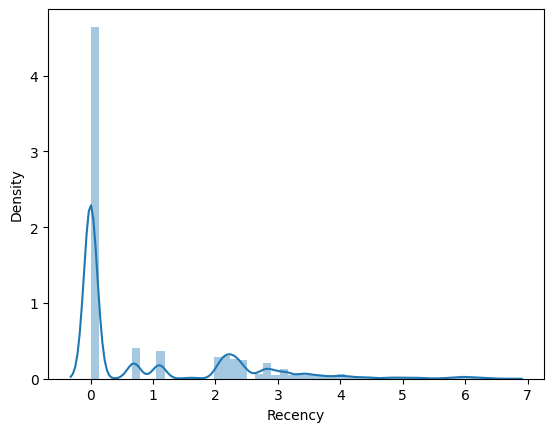

In [112]:
#Data distribution after data normalization for Recency
Recency_Plot = Log_Tfd_Data['Recency']
ax = sns.distplot(Recency_Plot)

<ipython-input-113-66e4e9679d1b>:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




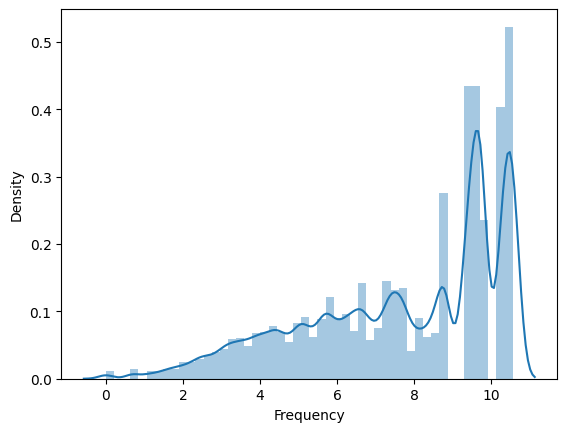

In [113]:
#Data distribution after data normalization for Frequency
Frequency_Plot = Log_Tfd_Data.query('Frequency < 10000')['Frequency']
ax = sns.distplot(Frequency_Plot)

<ipython-input-114-674b6fecbf20>:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




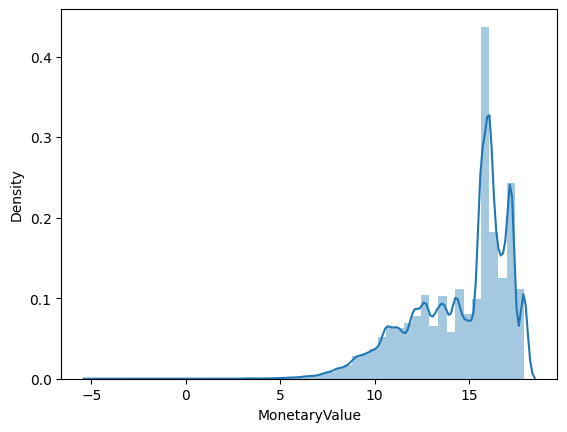

In [114]:
#Data distribution after data normalization for Monetary
Monetary_Plot = Log_Tfd_Data.query('MonetaryValue < 1000000')['MonetaryValue']
ax = sns.distplot(Monetary_Plot)

In [115]:
from sklearn.preprocessing import StandardScaler

#Bring the data on same scale
scaleobj = StandardScaler()
Scaled_Data = scaleobj.fit_transform(Log_Tfd_Data)

#Transform it back to dataframe
Scaled_Data = pd.DataFrame(Scaled_Data, index = df.index, columns = Log_Tfd_Data.columns)

#Elbow method to find 'k' in clustering

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
sum_of_sq_dist = {}
for k in range(1,15):
    km = KMeans(n_clusters= k, init= 'k-means++', max_iter= 1000)
    km = km.fit(Scaled_Data)
    sum_of_sq_dist[k] = km.inertia_
    
#Plot the graph for the sum of square distance values and Number of Clusters
sns.pointplot(x = list(sum_of_sq_dist.keys()), y = list(sum_of_sq_dist.values()))
plt.xlabel('Number of Clusters(k)')
plt.ylabel('Sum of Square Distances')
plt.title('Elbow Method For Optimal k')
plt.show()

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change fro

 elbow method to determine the optimal number of clusters for KMeans clustering. It loops through different values of k (number of clusters) and calculates the sum of squared distances of each point in a cluster from the centroid of that cluster. It then plots a graph of the sum of squared distances versus the number of clusters.

The "elbow" in the plot represents the point of diminishing returns, beyond which adding more clusters doesn't improve the clustering performance significantly. The optimal number of clusters is chosen at this "elbow" point.

In this case, it seems that the optimal number of clusters is 3, as that is where the elbow in the plot occurs.

In [ ]:
#Perform K-Mean Clustering or build the K-Means clustering model
KMean_clust = KMeans(n_clusters= 4, init= 'k-means++', max_iter= 1000)
KMean_clust.fit(Scaled_Data)

#Find the clusters for the observation given in the dataset
df['Cluster'] = KMean_clust.labels_
df.head()

In [118]:
df[['RFM_Loyalty_Level', 'Cluster']].nunique()

RFM_Loyalty_Level    4
Cluster              4
dtype: int64

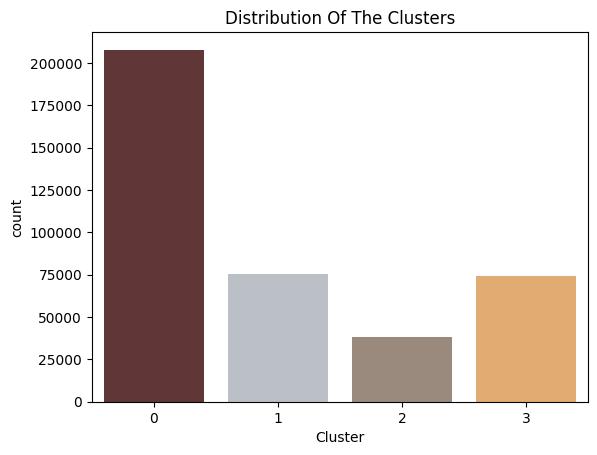

In [121]:
#Plotting countplot of clusters
pal = ["#682F2F","#B9C0C9", "#9F8A78","#F3AB60"]
pl = sns.countplot(x=df['Cluster'], palette= pal)
pl.set_title("Distribution Of The Clusters")
plt.show()

In [ ]:
from matplotlib import pyplot as plt
plt.figure(figsize=(7,7))

##Scatter Plot Frequency Vs Recency
Colors = ["red", "green", "blue", "pink"]
df['Color'] = df['Cluster'].map(lambda p: Colors[p])
ax = df.plot(    
    kind="scatter", 
    x="Recency", y="Frequency",
    figsize=(10,8),
    c = df['Color']
)

In [ ]:
df.head()

In [ ]:
df.columns

<Figure size 1000x800 with 0 Axes>

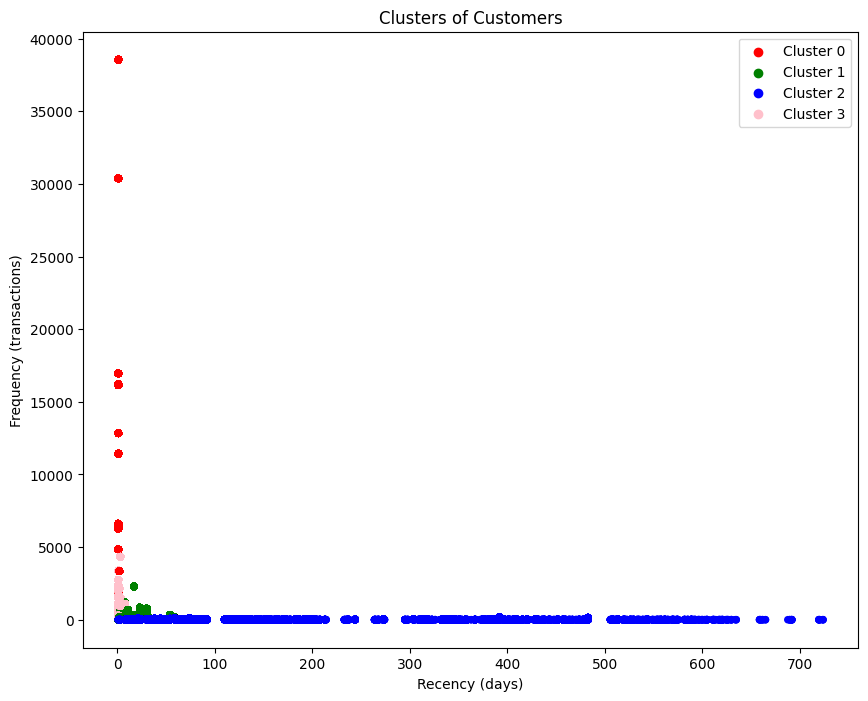

In [123]:
from matplotlib import pyplot as plt

plt.figure(figsize=(10,8))

# Define colors for each cluster
colors = ["red", "green", "blue", "pink"]
df['Color'] = df['Cluster'].map(lambda p: colors[p])

# Create scatter plot
ax = df.plot(
    kind="scatter",
    x="Recency",
    y="Frequency",
    c=df['Color'],
    figsize=(10,8)
)

# Add legend
for i, color in enumerate(colors):
    ax.scatter([], [], c=color, label=f'Cluster {i}')
ax.legend()
plt.title('Clusters of Customers')
plt.xlabel('Recency (days)')
plt.ylabel('Frequency (transactions)')
plt.show()


<Figure size 1000x800 with 0 Axes>

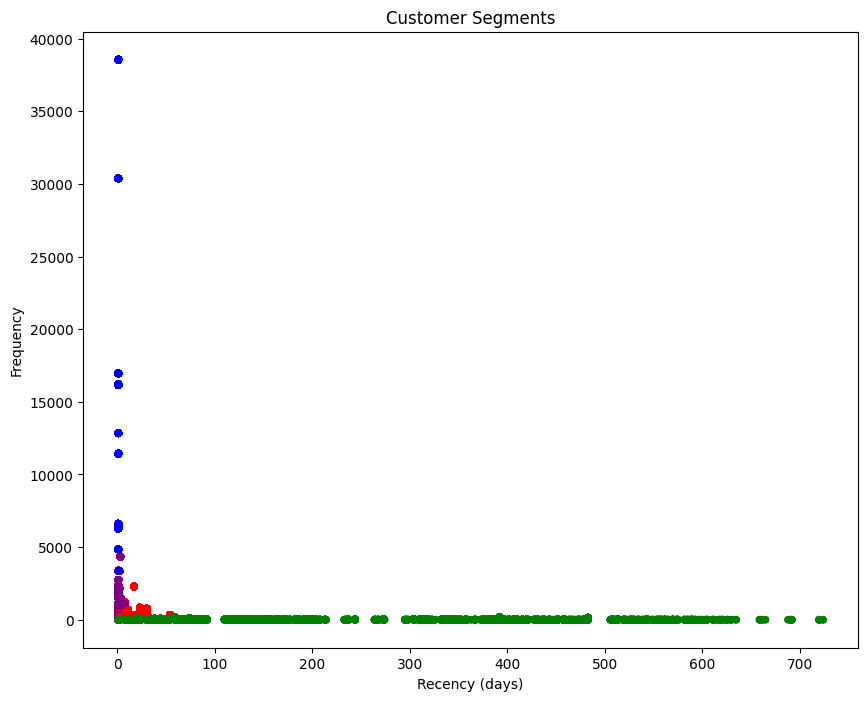

In [124]:
# Map cluster labels to customer segments
cluster_map = {0: 'bronze', 1: 'platinum', 2: 'silver', 3: 'gold'}
df['Segment'] = df['Cluster'].map(cluster_map)

# Plot scatter plot with color-coded segments
plt.figure(figsize=(10, 8))
colors = ['blue', 'red', 'green', 'purple']
df['Color'] = df['Segment'].map(lambda x: colors[list(cluster_map.values()).index(x)])
ax = df.plot(kind='scatter', x='Recency', y='Frequency', c=df['Color'], figsize=(10, 8))
ax.set_xlabel('Recency (days)')
ax.set_ylabel('Frequency')
ax.set_title('Customer Segments')
plt.show()


In [122]:
import plotly.express as px

fig = px.scatter_3d(df, x='Recency', y='Frequency', z='MonetaryValue',
              color='Cluster', opacity=0.8, size_max=5)

fig.update_layout(scene=dict(xaxis_title='Recency', yaxis_title='Frequency', zaxis_title='MonetaryValue'),
                  title='3D Cluster Visualization')

fig.show()


In [ ]:
fig.write_html('3d_cluster_visualization.html')